In [1]:
import plotly.figure_factory as ff

In [2]:
# EDA Libraries
import pandas as pd
import numpy as np
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.subplots as sp
import plotly.graph_objects as go
import seaborn as sns
import matplotlib.pyplot as plt

# Data Preprocessing Libraries
from sklearn.model_selection import train_test_split, cross_validate
from sklearn.preprocessing import StandardScaler, OneHotEncoder, RobustScaler
from sklearn.impute import SimpleImputer
from imblearn.over_sampling import SMOTE

# Machine Learing (classification models) Libraries
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import f_regression, RFE, SelectFromModel
from imblearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score, classification_report, roc_curve, roc_auc_score, precision_score, recall_score

#### Data Exploration (Khám phá dữ liệu)

In [3]:
# Đường dẫn URL của Google Sheet
sheet_id = "1S0Eff2oG7EBIcu2B-W3meH4mJcRrrT_YAnBo1Rx4vJY"

# Modified URL for CSV export
url = f'https://docs.google.com/spreadsheets/d/{sheet_id}/export?format=csv'

# Read the CSV data into a pandas DataFrame
df = pd.read_csv(url)

# Display the first few rows of the DataFrame
df.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,12691.0,777,11914.0,1.335,1144,42,1.625,61.00,"9,34E-01",99.991
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,8256.0,864,7392.0,1.541,1291,33,3.714,105.00,"5,69E-01",99.994
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,3418.0,0,3418.0,2.594,1887,20,2.333,0.00,"2,11E-01",99.998
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,...,3313.0,2517,796.0,1.405,1171,20,2.333,0.76,13.366,99.987
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,4716.0,0,4716.0,2.175,816,28,2.500,0.00,"2,17E-01",99.998


In [4]:
# Xóa cột CLIENTNUM vì đây là một mã định danh duy nhất và ko có giả trị dự đoán
df = df.drop('CLIENTNUM', axis=1)

In [5]:
# Xóa những cột không cần thiết
df = df.iloc[:, :-2]

In [6]:
df["Income_Category"].unique()

array(['$60K - $80K', 'Less than $40K', '$80K - $120K', '$40K - $60K',
       '$120K +', 'Unknown'], dtype=object)

In [7]:
df.shape


(10127, 20)

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Attrition_Flag            10127 non-null  object 
 1   Customer_Age              10127 non-null  int64  
 2   Gender                    10127 non-null  object 
 3   Dependent_count           10127 non-null  int64  
 4   Education_Level           10127 non-null  object 
 5   Marital_Status            10127 non-null  object 
 6   Income_Category           10127 non-null  object 
 7   Card_Category             10127 non-null  object 
 8   Months_on_book            10127 non-null  int64  
 9   Total_Relationship_Count  10127 non-null  int64  
 10  Months_Inactive_12_mon    10127 non-null  int64  
 11  Contacts_Count_12_mon     10127 non-null  int64  
 12  Credit_Limit              10127 non-null  float64
 13  Total_Revolving_Bal       10127 non-null  int64  
 14  Avg_Op

In [9]:
# Kiểm tra số lượng giá trị duy nhất trong mỗi cột của dữ liệu
df.nunique()

Attrition_Flag                 2
Customer_Age                  45
Gender                         2
Dependent_count                6
Education_Level                7
Marital_Status                 4
Income_Category                6
Card_Category                  4
Months_on_book                44
Total_Relationship_Count       6
Months_Inactive_12_mon         7
Contacts_Count_12_mon          7
Credit_Limit                6205
Total_Revolving_Bal         1974
Avg_Open_To_Buy             6813
Total_Amt_Chng_Q4_Q1        1158
Total_Trans_Amt             5033
Total_Trans_Ct               126
Total_Ct_Chng_Q4_Q1          830
Avg_Utilization_Ratio        964
dtype: int64

- Biến phân loại: Attrition_Flag, Gender,..
- Biến liên tục: Customer_Age, Credit_Limit, Total_Trans_Amt, Total_Revolving_Bal,..
- Biến rời rạc: Dependent_count,Total_Relationship_Count, Months_Inactive_12_mon, Contacts_Count_12_mon,..

In [10]:
df.describe()

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
count,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000
mean,46.325960,2.346203,35.928409,3.812580,2.341167,2.455317,8631.953698,1162.814061,7469.139637,574.688943,4404.086304,64.858695,518.464910,247.333503
std,8.016814,1.298908,7.986416,1.554408,1.010622,1.106225,9088.776650,814.987335,9090.685324,310.108088,3397.129254,23.472570,316.647227,274.452904
min,26.000000,0.000000,13.000000,1.000000,0.000000,0.000000,1438.300000,0.000000,3.000000,0.000000,510.000000,10.000000,0.000000,0.000000
25%,41.000000,1.000000,31.000000,3.000000,2.000000,2.000000,2555.000000,359.000000,1324.500000,484.000000,2155.500000,45.000000,316.000000,0.060000
50%,46.000000,2.000000,36.000000,4.000000,2.000000,2.000000,4549.000000,1276.000000,3474.000000,674.000000,3899.000000,67.000000,625.000000,132.000000
75%,52.000000,3.000000,40.000000,5.000000,3.000000,3.000000,11067.500000,1784.000000,9859.000000,792.000000,4741.000000,81.000000,761.000000,463.000000
max,73.000000,5.000000,56.000000,6.000000,6.000000,6.000000,34516.000000,2517.000000,34516.000000,999.000000,18484.000000,139.000000,981.000000,999.000000


- Nhìn chung, bộ dữ liệu có sự phân tán lớn ở một số cột như Credit_Limit, Avg_Open_To_Buy, và Total_Trans_Amt.

In [11]:
# Thống kê mô tả cho các biến phân loại (kiểu dữ liệu object)
df.describe(include='O')

,Attrition_Flag,Gender,Education_Level,Marital_Status,Income_Category,Card_Category
count,10127,10127,10127,10127,10127,10127
unique,2,2,7,4,6,4
top,Existing Customer,F,Graduate,Married,Less than $40K,Blue
freq,8500,5358,3128,4687,3561,9436


- Phần lớn khách hàng là nữ, có trình độ học vấn là 'Graduate', đã kết hôn, có thu nhập dưới $40K và sử dụng thẻ loại 'Blue'


In [12]:
# Kiểm tra giá trị trùng lặp
df.duplicated().sum()

np.int64(0)

- Dữ liệu không chứa bất kỳ giá trị trùng lặp nào

In [13]:
df.isnull().sum()

Attrition_Flag              0
Customer_Age                0
Gender                      0
Dependent_count             0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal         0
Avg_Open_To_Buy             0
Total_Amt_Chng_Q4_Q1        0
Total_Trans_Amt             0
Total_Trans_Ct              0
Total_Ct_Chng_Q4_Q1         0
Avg_Utilization_Ratio       0
dtype: int64

#### 3. Phân tích khám phá dữ liệu (Exploratory Data Analysis - EDA)

In [14]:
# Tách các cột thành biến phân loại (Categorical) và biến số (Numerical)

# Biến phân loại (Categorical Variables)
categorical_features = df.select_dtypes(include=['object']).columns

# Biến số (Numerical Variables)
numerical_features = df.select_dtypes(include=['float64', 'int64']).columns

##### 3.1. Phân tích đơn biến (Univariate Analysis)
###### - Kiểm tra phân phối dữ liệu của từng biến một cách riêng lẻ.
###### - Giúp phát hiện các ngoại lệ, mất cân bằng dữ liệu hoặc cần biến đổi dữ liệu trước khi huấn luyện mô hình.

##### Exploration: Categorical Features

In [15]:
import plotly.express as px

# Vẽ biểu đồ tròn (Pie Chart) cho biến Attrition_Flag
fig = px.pie(df, names='Attrition_Flag',
             title='Attrition Flag Distribution',
             color_discrete_sequence=['#FF9999', '#66B3FF'],
            )

# Định dạng layout
fig.update_layout(
    xaxis=dict(showgrid=False, zeroline=False),
    yaxis=dict(zeroline=False, gridcolor='white'),
    paper_bgcolor='rgb(233,233,233)',
    plot_bgcolor='rgb(233,233,233)',
)
# Định dạng đường viền của từng phần trong biểu đồ
fig.update_traces(marker=dict(line=dict(width=2, color='DarkSlateGrey')))

fig.show()

###### Tỷ lệ khách hàng rời bỏ mất cân đối, 83.9% khách hàng không rời bỏ và 16.1% rời bỏ, cho thấy phần lớn khách hàng duy trì sử dụng dịch vụ, tỷ lệ rời bỏ khá thấp.

In [16]:
## Vẽ biểu đồ tròn (Pie Chart) cho biến Gender
fig = px.pie(df, names='Gender',
             title='Gender Distribution',
             color_discrete_sequence=['#FF9999', '#66B3FF'],
            )

# Định dạng layout
fig.update_layout(
    xaxis=dict(showgrid=False, zeroline=False),
    yaxis=dict(zeroline=False, gridcolor='white'),
    paper_bgcolor='rgb(233,233,233)',
    plot_bgcolor='rgb(233,233,233)',
)

fig.update_traces(marker=dict(line=dict(width=2, color='DarkSlateGrey')))

fig.show()

###### 52.9% khách hàng là nữ và 47.1% khách hàng là nam cho thấy không có sự chênh lệch đáng kể về giới tính trong tập dữ liệu

In [17]:
fig = px.histogram(df, x='Gender', color='Attrition_Flag',
                   title='Gender by Attrition Flag',
                   barmode='group',  # Hiển thị cột nhóm
                   color_discrete_sequence=['#66B3FF', '#FF9999'],
                   text_auto=True)

fig.update_traces(marker=dict(line=dict(width=2, color='DarkSlateGrey')))

# Đưa số ra ngoài cột
fig.update_traces(
    textposition='outside',
    marker=dict(line=dict(width=2, color='DarkSlateGrey'))
)

# Định dạng layout
fig.update_layout(
    xaxis=dict(showgrid=False, zeroline=False),
    yaxis=dict(zeroline=False, gridcolor='white'),
    paper_bgcolor='rgb(233,233,233)',
    plot_bgcolor='rgb(233,233,233)',
)

fig.show()

- Tỷ lệ khách hàng rời bỏ dịch vụ ở cả hai giới tính có sự chênh lệch không đáng kể nên tập trung vào các yếu tố khác

In [18]:
fig = px.histogram(df, x='Education_Level',
                   title='Education Level Distribution',
                   color_discrete_sequence=['#66B3FF'],
                   text_auto=True
                  )

fig.update_traces(marker=dict(line=dict(width=2, color='DarkSlateGrey')))

# Đưa số ra ngoài cột
fig.update_traces(
    textposition='outside',
    marker=dict(line=dict(width=2, color='DarkSlateGrey'))
)

# format the layout
fig.update_layout(
    xaxis=dict(showgrid=False, zeroline=False),
    yaxis=dict(zeroline=False, gridcolor='white'),
    paper_bgcolor='rgb(233,233,233)',
    plot_bgcolor='rgb(233,233,233)',
)

fig.show()

In [19]:
fig = px.histogram(df, x='Education_Level', color='Attrition_Flag',
                   title='Education Level by Attrition Flag',
                   barmode='group',  # Hiển thị cột nhóm
                   color_discrete_sequence=['#66B3FF', '#FF9999'],
                   text_auto=True)

fig.update_traces(marker=dict(line=dict(width=2, color='DarkSlateGrey')))

# Đưa số ra ngoài cột
fig.update_traces(
    textposition='outside',
    marker=dict(line=dict(width=2, color='DarkSlateGrey'))
)

# Định dạng layout
fig.update_layout(
    xaxis=dict(showgrid=False, zeroline=False),
    yaxis=dict(zeroline=False, gridcolor='white'),
    paper_bgcolor='rgb(233,233,233)',
    plot_bgcolor='rgb(233,233,233)',
)

fig.show()

- Graduate (Cử nhân): Chiếm tỷ lệ cao nhất.
- High School (Trung học phổ thông): Số lượng lớn, đứng thứ hai.
- Uneducated (Không có giáo dục) & Unknown (Không rõ trình độ): Số lượng tương đương, khá cao.
- College (Cao đẳng): Ít hơn các nhóm trên.
- Post-Graduate (Sau đại học) & Doctorate (Tiến sĩ): Chiếm tỷ lệ rất nhỏ.
\
> Những khách hàng có trình độ cao có thể có thu nhập ổn định hơn và có mối quan hệ tài chính lâu dài với ngân hàng

In [20]:
fig = px.histogram(df, x='Marital_Status',
                   title='Marital Status Distribution',
                   color_discrete_sequence=['#66B3FF'],
                   text_auto=True
                  )

fig.update_traces(marker=dict(line=dict(width=2, color='DarkSlateGrey')))

# Đưa số ra ngoài cột
fig.update_traces(
    textposition='outside',
    marker=dict(line=dict(width=2, color='DarkSlateGrey'))
)

# format the layout
fig.update_layout(
    xaxis=dict(showgrid=False, zeroline=False),
    yaxis=dict(zeroline=False, gridcolor='white'),
    paper_bgcolor='rgb(233,233,233)',
    plot_bgcolor='rgb(233,233,233)',
)

fig.show()

In [21]:
fig = px.histogram(df, x='Marital_Status', color='Attrition_Flag',
                   title='Marital_Status by Attrition Flag',
                   barmode='group',  # Hiển thị cột nhóm
                   color_discrete_sequence=['#66B3FF', '#FF9999'],
                   text_auto=True)

fig.update_traces(marker=dict(line=dict(width=2, color='DarkSlateGrey')))

# Đưa số ra ngoài cột
fig.update_traces(
    textposition='outside',
    marker=dict(line=dict(width=2, color='DarkSlateGrey'))
)

# Định dạng layout
fig.update_layout(
    xaxis=dict(showgrid=False, zeroline=False),
    yaxis=dict(zeroline=False, gridcolor='white'),
    paper_bgcolor='rgb(233,233,233)',
    plot_bgcolor='rgb(233,233,233)',
)

fig.show()

In [22]:
income_order = ['Less than $40K', '$40K - $60K', '$60K - $80K', '$80K - $120K', '$120K +', 'Unknown']

fig = px.histogram(df, x='Income_Category',
                   title='Income Category Distribution',
                   color_discrete_sequence=['#66B3FF'],
                   category_orders={'Income_Category': income_order}, # Định nghĩa thứ tự mong muốn
                   text_auto=True)

fig.update_traces(marker=dict(line=dict(width=2, color='DarkSlateGrey')))

# Đưa số ra ngoài cột
fig.update_traces(
    textposition='outside',
    marker=dict(line=dict(width=2, color='DarkSlateGrey'))
)

# Format layout
fig.update_layout(
    xaxis=dict(showgrid=False, zeroline=False),
    yaxis=dict(zeroline=False, gridcolor='white'),
    paper_bgcolor='rgb(233,233,233)',
    plot_bgcolor='rgb(233,233,233)',
)

fig.show()


In [23]:
fig = px.histogram(df, x='Income_Category', color='Attrition_Flag',
                   title='Income_Category by Attrition Flag',
                   barmode='group',  # Hiển thị cột nhóm
                   color_discrete_sequence=['#66B3FF', '#FF9999'],
                   text_auto=True,
                   category_orders={'Income_Category': income_order})

fig.update_traces(marker=dict(line=dict(width=2, color='DarkSlateGrey')))

# Đưa số ra ngoài cột
fig.update_traces(
    textposition='outside',
    marker=dict(line=dict(width=2, color='DarkSlateGrey'))
)

# Định dạng layout
fig.update_layout(
    xaxis=dict(showgrid=False, zeroline=False),
    yaxis=dict(zeroline=False, gridcolor='white'),
    paper_bgcolor='rgb(233,233,233)',
    plot_bgcolor='rgb(233,233,233)',
)

fig.show()

- Nhóm thu nhập **Less than $40K** có tỷ lệ rời bỏ cao nhất, có thể do khả năng tài chính hạn chế

- Nhóm thu nhập từ **$40K - $80K** cũng có số lượng rời bỏ đáng kể.

- Nhóm có thu nhập cao hơn **$120K+** có tỷ lệ rời bỏ thấp, cho thấy sự ổn định hơn trong việc sử dụng dịch vụ.

In [24]:
fig = px.histogram(df, x='Card_Category',
                   title='Card Category Distribution',
                   text_auto=True,
                   color_discrete_sequence=['#66B3FF'],  # Setting custom color
                  )

fig.update_traces(marker=dict(line=dict(width=2, color='DarkSlateGrey')))

# Đưa số ra ngoài cột
fig.update_traces(
    textposition='outside',
    marker=dict(line=dict(width=2, color='DarkSlateGrey'))
)

# format the layout
fig.update_layout(
    xaxis=dict(showgrid=False, zeroline=False),
    yaxis=dict(zeroline=False, gridcolor='white'),
    paper_bgcolor='rgb(233,233,233)',
    plot_bgcolor='rgb(233,233,233)',
)

fig.show()

In [25]:
fig = px.histogram(df, x='Card_Category', color='Attrition_Flag',
                   title='Card_Category by Attrition Flag',
                   barmode='group',  # Hiển thị cột nhóm
                   color_discrete_sequence=['#66B3FF', '#FF9999'],
                   text_auto=True)

fig.update_traces(marker=dict(line=dict(width=2, color='DarkSlateGrey')))

# Đưa số ra ngoài cột
fig.update_traces(
    textposition='outside',
    marker=dict(line=dict(width=2, color='DarkSlateGrey'))
)

# Định dạng layout
fig.update_layout(
    xaxis=dict(showgrid=False, zeroline=False),
    yaxis=dict(zeroline=False, gridcolor='white'),
    paper_bgcolor='rgb(233,233,233)',
    plot_bgcolor='rgb(233,233,233)',
)

fig.show()

##### Exploration: Numerical Features

##### Skewed Continuous Features Exploration (Khám phá các biến liên tục có phân phối lệch)

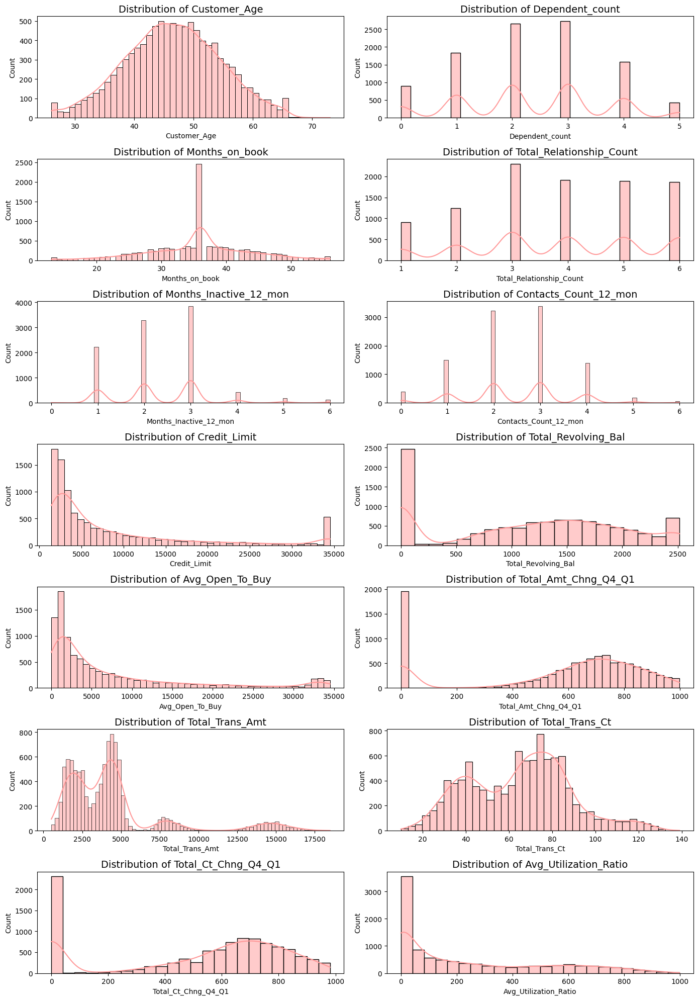

In [26]:
# Create subplots with specified dimensions
fig, axes = plt.subplots(7, 2, figsize=(14, 20))  # Adjust the figsize according to your preference

# Plot distribution plots for each skewed column
for i, column in enumerate(numerical_features):
    row = i // 2  # Calculate the row for the subplot
    col = i % 2   # Calculate the column for the subplot
    sns.histplot(data=df, x=column, kde=True, ax=axes[row, col], color='#FF9999')
    axes[row, col].set_title(f'Distribution of {column}', fontsize=14)

# Remove any empty subplots if there are fewer numerical features than expected
for i in range(len(numerical_features), 7 * 2):
    row = i // 2
    col = i % 2
    fig.delaxes(axes[row, col])

plt.tight_layout()
plt.show()

- **Biến có phân phối gần chuẩn hoặc cân đối**: Customer_Age, Total_Trans_Ct
- **Các biến có sự phân bố không đều, mang tính phân loại**:
\
Dependent_count, Total_Relationship_Count, Months_Inactive_12_mon, Contacts_Count_12_mon

> *Các biến này có số lượng giá trị rời rạc, thể hiện đặc trưng của biến phân loại hoặc dữ liệu nhóm*

- **Các biến có phân phối lệch**:
\
Credit_Limit, Avg_Open_To_Buy, Total_Revolving_Bal, Avg_Utilization_Ratio, Total_Trans_Amt; Total_Amt_Chng_Q4_Q1, Total_Ct_Chng_Q4_Q1

> *Dữ liệu tập trung nhiều ở một khoảng giá trị nhỏ và giảm dần khi giá trị tăng lên*

#### 3.2. Phân tích mối quan hệ hai biến (Bivariate Analysis)

###### Mối quan hệ giữa trạng thái rời bỏ dịch vụ (Churn Status) và các biến phân loại khác như Giới tính (Gender), Trình độ học vấn (Education Level), Tình trạng hôn nhân (Marital Status) và Nhóm thu nhập (Income Category) là gì?

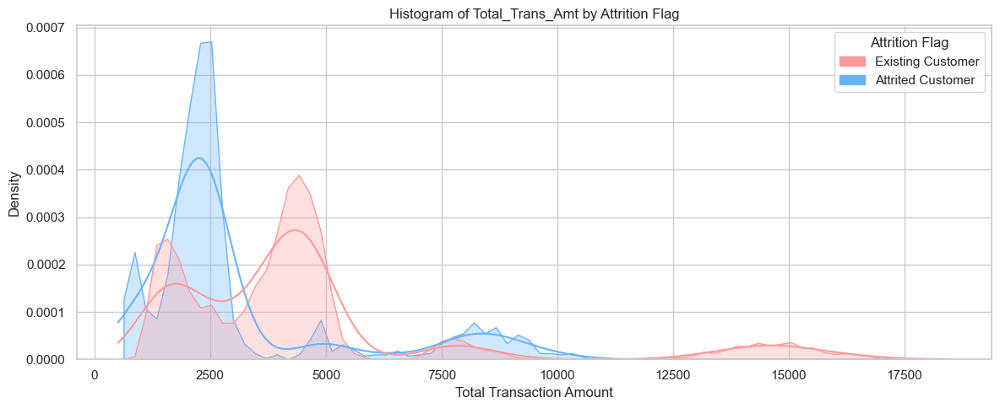

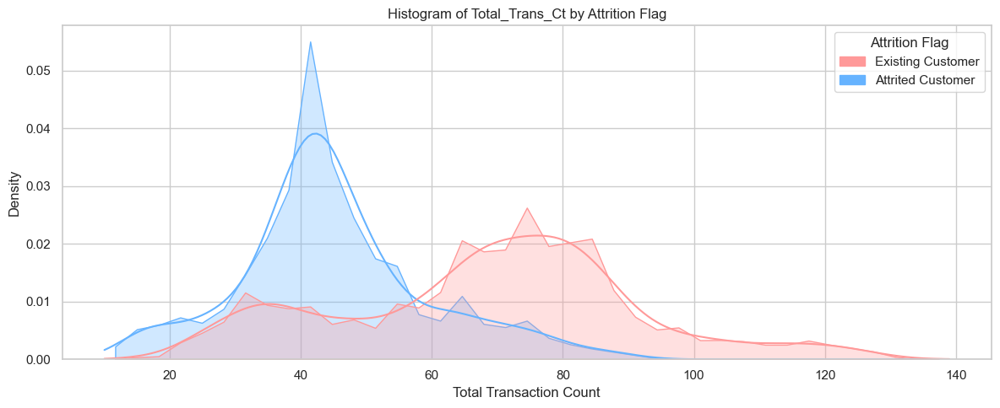

In [27]:
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

# Thiết lập style
sns.set(style="whitegrid")

# Tạo custom palette
palette = {
    "Existing Customer": "#FF9999",
    "Attrited Customer": "#66B3FF"
}

# Histogram cho Total_Trans_Amt
plt.figure(figsize=(12, 5))
ax = sns.histplot(
    data=df,
    x="Total_Trans_Amt",
    hue="Attrition_Flag",
    kde=True,
    stat="density",
    common_norm=False,
    element="poly",
    fill=True,
    palette=palette,
    alpha=0.3
)
plt.title("Histogram of Total_Trans_Amt by Attrition Flag")
plt.xlabel("Total Transaction Amount")
plt.ylabel("Density")

# Tạo legend thủ công
handles = [
    mpatches.Patch(color=palette["Existing Customer"], label="Existing Customer"),
    mpatches.Patch(color=palette["Attrited Customer"], label="Attrited Customer")
]
plt.legend(handles=handles, title="Attrition Flag")

plt.tight_layout()
plt.show()

# Histogram cho Total_Trans_Ct
plt.figure(figsize=(12, 5))
ax = sns.histplot(
    data=df,
    x="Total_Trans_Ct",
    hue="Attrition_Flag",
    kde=True,
    stat="density",
    common_norm=False,
    element="poly",
    fill=True,
    palette=palette,
    alpha=0.3
)
plt.title("Histogram of Total_Trans_Ct by Attrition Flag")
plt.xlabel("Total Transaction Count")
plt.ylabel("Density")

# Legend thủ công
handles = [
    mpatches.Patch(color=palette["Existing Customer"], label="Existing Customer"),
    mpatches.Patch(color=palette["Attrited Customer"], label="Attrited Customer")
]
plt.legend(handles=handles, title="Attrition Flag")

plt.tight_layout()
plt.show()

In [28]:
fig = px.histogram(df, x='Customer_Age', color='Attrition_Flag', title='The Effect of Age on Risk of Heart Attack (Output)',
                   labels={'age': 'Age', 'output': 'Output'},
                   marginal='box', barmode='group',
                   color_discrete_sequence=['#66B3FF', '#FF9999']
                 )

# Customizing marker appearance
fig.update_traces(marker=dict(line=dict(width=2, color='DarkSlateGrey')))

# format the layout
fig.update_layout(
    xaxis=dict(showgrid=False, zeroline=False),
    yaxis=dict(zeroline=False, gridcolor='white'),
    paper_bgcolor='rgb(233,233,233)',
    plot_bgcolor='rgb(233,233,233)',
)

fig.show()

- Tuổi không có ảnh hưởng rõ ràng đến churn, khách hàng ở mọi độ tuổi có tỷ lệ rời bỏ tương đương. Cần xem xét thêm các yếu tố khác để xác định nguyên nhân churn

## **4. Tiền xử lý dữ liệu (Data Preprocessing)**

#### **4.2. Handling Outliers**

In [29]:
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

num_plots = len(numerical_features)
cols = 2  # Số cột trong lưới hiển thị
rows = (num_plots // cols) + (num_plots % cols > 0)  # Tính số hàng cần thiết

# Tạo figure với các subplot
fig = make_subplots(rows=rows, cols=cols, subplot_titles=numerical_features)

for i, col in enumerate(numerical_features):
    row = i // cols + 1
    col_pos = i % cols + 1

    box_plot = px.box(df, x='Attrition_Flag', y=col, color='Attrition_Flag',
                      color_discrete_sequence=['#FF9999', '#66B3FF'])

    for trace in box_plot.data:
        fig.add_trace(trace, row=row, col=col_pos)

# Cập nhật layout
fig.update_layout(
    height=400 * rows, width=800,
    title_text="Box Plot of Numerical Features by Attrition_Flag",
    showlegend=False,
    paper_bgcolor='rgb(233,233,233)',
    plot_bgcolor='rgb(233,233,233)',
)

fig.show()

#### **Các biến liên quan đến hạn mức tín dụng và giao dịch có nhiều ngoại lai nhất:**
- Credit_Limit – Hạn mức tín dụng
- Avg_Open_To_Buy – Số dư khả dụng
- Total_Trans_Amt – Tổng số tiền giao dịch
- Total_Trans_Ct – Tổng số lần giao dịch
- Total_Amt_Chng_Q4_Q1 – Sự thay đổi số tiền giao dịch giữa hai quý
- Total_Ct_Chng_Q4_Q1 – Biến động số lần giao dịch giữa hai quý

In [30]:
!pip install datasist


[notice] A new release of pip is available: 24.3.1 -> 25.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [31]:
# Xử lí outliers
# Áp dụng Winsorization 5%–95%
for col in numerical_features:
    lower = df[col].quantile(0.05)
    upper = df[col].quantile(0.95)
    df[col] = np.clip(df[col], lower, upper)

In [32]:
df.shape

(10127, 20)

In [33]:
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

num_plots = len(numerical_features)
cols = 2  # Số cột trong lưới hiển thị
rows = (num_plots // cols) + (num_plots % cols > 0)  # Tính số hàng cần thiết

# Tạo figure với các subplot
fig = make_subplots(rows=rows, cols=cols, subplot_titles=numerical_features)

for i, col in enumerate(numerical_features):
    row = i // cols + 1
    col_pos = i % cols + 1

    box_plot = px.box(df, x='Attrition_Flag', y=col, color='Attrition_Flag',
                      color_discrete_sequence=['#FF9999', '#66B3FF'])

    for trace in box_plot.data:
        fig.add_trace(trace, row=row, col=col_pos)

# Cập nhật layout
fig.update_layout(
    height=400 * rows, width=800,
    title_text="Box Plot of Numerical Features by Attrition_Flag",
    showlegend=False,
    paper_bgcolor='rgb(233,233,233)',
    plot_bgcolor='rgb(233,233,233)',
)

fig.show()

#### **4.3. Handling Categorical Data**

- **Nominal**: Các danh mục không có thứ tự hoặc xếp hạng có ý nghĩa, chẳng hạn như (Trạng thái rời bỏ, Giới tính, Tình trạng hôn nhân).
- **Ordinal**: Các danh mục có thứ tự hoặc xếp hạng có ý nghĩa, chẳng hạn như (Trình độ học vấn, Nhóm thu nhập, Hạng thẻ)

In [34]:
df['Attrition_Flag'] = df['Attrition_Flag'].map({'Existing Customer': 1, 'Attrited Customer': 0})

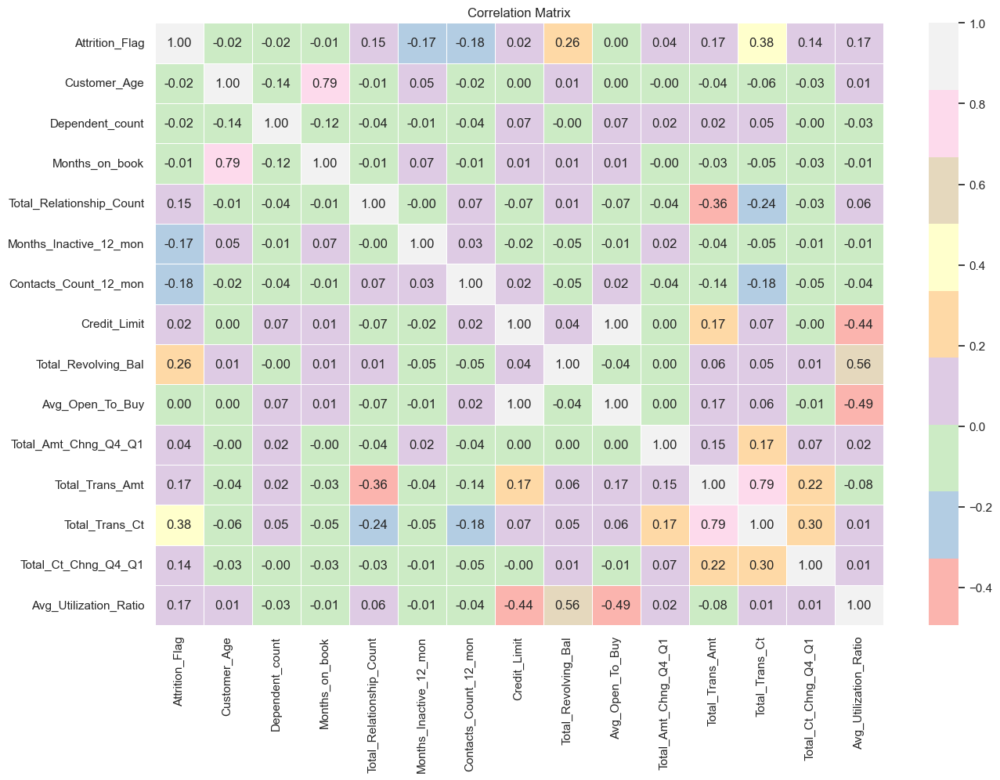

In [35]:
numerical_features = df.select_dtypes(include=['float64', 'int64']).columns

# Chọn các cột cần tính toán ma trận tương quan
features = numerical_features.tolist()

# Tính toán ma trận tương quan
corr_matrix = df[features].corr()

# Vẽ biểu đồ heatmap cho ma trận tương quan
plt.figure(figsize=(15, 10))
sns.heatmap(corr_matrix, annot=True, cmap='Pastel1', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()

In [36]:
# Làm việc với các Ordinal Features bằng map fuction
edu_level_dic = {
    'Unknown': 0,
    'Uneducated': 1,
    'High School': 2,
    'College': 3,
    'Post-Graduate': 4,
    'Graduate': 5,
    'Doctorate': 6
}
income_cat_dic = {
    'Unknown': 0,
    'Less than $40K': 1,
    '$40K - $60K': 2,
    '$60K - $80K': 3,
    '$80K - $120K': 4,
    '$120K +': 5
}
card_cat_dic = {
    'Blue': 0,
    'Silver': 1,
    'Gold': 2,
    'Platinum': 3
}
df['Education_Level'] = df['Education_Level'].map(edu_level_dic)
df['Income_Category'] = df['Income_Category'].map(income_cat_dic)
df['Card_Category'] = df['Card_Category'].map(card_cat_dic)

df.head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,1,45,M,3,2,Married,3,0,39,5,1,3,12691.0,777,11914.0,1.335,1283.3,42,1.625,61.00
1,1,49,F,4,5,Single,1,0,44,6,1,2,8256.0,864,7392.0,1.541,1291.0,33,3.714,105.00
2,1,51,M,3,5,Married,4,0,36,4,1,1,3418.0,0,3418.0,2.594,1887.0,28,2.333,0.00
3,1,40,F,4,2,Unknown,1,0,34,3,4,1,3313.0,2517,796.0,1.405,1283.3,28,2.333,0.76
4,1,40,M,3,1,Married,3,0,22,5,1,1,4716.0,0,4716.0,2.175,1283.3,28,2.500,0.00


In [37]:
# Làm việc với các Nominal Features bằng get_dumies fuction
df = pd.get_dummies(df, columns=['Gender', 'Marital_Status'])

encoded = list(df.columns)
print("{} total features after one-hot encoding.".format(len(encoded)))

24 total features after one-hot encoding.


In [38]:
# Chuyển tất cả các cột kiểu bool thành int
df[df.select_dtypes("bool").columns] = df.select_dtypes("bool").astype(int)

print(df.dtypes)


Attrition_Flag                int64
Customer_Age                  int64
Dependent_count               int64
Education_Level               int64
Income_Category               int64
Card_Category                 int64
Months_on_book                int64
Total_Relationship_Count      int64
Months_Inactive_12_mon        int64
Contacts_Count_12_mon         int64
Credit_Limit                float64
Total_Revolving_Bal           int64
Avg_Open_To_Buy             float64
Total_Amt_Chng_Q4_Q1        float64
Total_Trans_Amt             float64
Total_Trans_Ct                int64
Total_Ct_Chng_Q4_Q1         float64
Avg_Utilization_Ratio       float64
Gender_F                      int64
Gender_M                      int64
Marital_Status_Divorced       int64
Marital_Status_Married        int64
Marital_Status_Single         int64
Marital_Status_Unknown        int64
dtype: object


In [39]:
df.head ()

,Attrition_Flag,Customer_Age,Dependent_count,Education_Level,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,...,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Gender_F,Gender_M,Marital_Status_Divorced,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown
0,1,45,3,2,3,0,39,5,1,3,...,1283.3,42,1.625,61.00,0,1,0,1,0,0
1,1,49,4,5,1,0,44,6,1,2,...,1291.0,33,3.714,105.00,1,0,0,0,1,0
2,1,51,3,5,4,0,36,4,1,1,...,1887.0,28,2.333,0.00,0,1,0,1,0,0
3,1,40,4,2,1,0,34,3,4,1,...,1283.3,28,2.333,0.76,1,0,0,0,0,1
4,1,40,3,1,3,0,22,5,1,1,...,1283.3,28,2.500,0.00,0,1,0,1,0,0


### **4.4. Data Split to Train and Test Sets**

In [40]:
# Tách biến mục tiêu và các đặc trưng
X = df.drop(['Attrition_Flag'], axis=1)
y = df['Attrition_Flag']

### **4.5. Handling Imbalanced Data**

- Dữ liệu bị mất cân bằng,  số lượng khách hàng rời bỏ ít hơn nhiều so với số lượng khách hàng không rời bỏ
> - **SMOTE (Synthetic Minority Over-sampling Technique)** là một kỹ thuật tăng mẫu dữ liệu thiểu số bằng cách tạo ra các điểm dữ liệu mới thay vì sao chép lại dữ liệu cũ
> - **Under-sampling** là phương pháp giảm số lượng mẫu của lớp đa số, nhưng có thể gây mất thông tin quan trọng, làm giảm độ chính xác của mô hình

In [41]:
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import TomekLinks

# --------------------------
# 1. Chia dữ liệu
# --------------------------

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, stratify=y, random_state=42
)
# --------------------------

# 2. Xử lý dữ liệu mất cân bằng (SMOTE & Tomek Links)
# --------------------------

# Áp dụng SMOTE để xử lý mất cân bằng
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# Áp dụng Tomek Links để làm sạch dữ liệu
tomek = TomekLinks()
X_train_tomek, y_train_tomek = tomek.fit_resample(X_train, y_train)

# Reset index để tránh lỗi
X_train_smote = X_train_smote.reset_index(drop=True)
y_train_smote = y_train_smote.reset_index(drop=True)
X_train_tomek = X_train_tomek.reset_index(drop=True)
y_train_tomek = y_train_tomek.reset_index(drop=True)

### **4.6. Dimensionality Reduction**

In [42]:
try:
    feature_names = X.columns.tolist()
except AttributeError:
    feature_names = [f'feature_{i}' for i in range(X.shape[1])] # Nếu X là numpy array

# --------------------------
# 1. Chuẩn hóa dữ liệu
# --------------------------

# SMOTE
scaler_smote = StandardScaler()
X_train_smote_scaled = scaler_smote.fit_transform(X_train_smote)
X_test_smote_scaled = scaler_smote.transform(X_test)

# Tomek
scaler_tomek = StandardScaler()
X_train_tomek_scaled = scaler_tomek.fit_transform(X_train_tomek)
X_test_tomek_scaled = scaler_tomek.transform(X_test)

In [43]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.feature_selection import RFECV
from sklearn.model_selection import StratifiedKFold
from sklearn.ensemble import RandomForestClassifier

# Định nghĩa StratifiedKFold với shuffle và random_state
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Định nghĩa mô hình Random Forest
rf = RandomForestClassifier(random_state=42)

# ====================== RFECV cho SMOTE ======================
rfecv_smote = RFECV(estimator=rf, step=1, cv=cv, scoring='f1')
rfecv_smote.fit(X_train_smote_scaled, y_train_smote)

# Áp dụng RFE cho SMOTE
X_train_smote_rfe = X_train_smote_scaled[:, rfecv_smote.support_]
X_test_smote_rfe = X_test_smote_scaled[:, rfecv_smote.support_]

print("Số đặc trưng giữ lại sau RFE (SMOTE):", rfecv_smote.n_features_)

# ====================== RFECV cho Tomek ======================
rfecv_tomek = RFECV(estimator=rf, step=1, cv=cv, scoring='f1')
rfecv_tomek.fit(X_train_tomek_scaled, y_train_tomek)

# Áp dụng RFE cho Tomek
X_train_tomek_rfe = X_train_tomek_scaled[:, rfecv_tomek.support_]
X_test_tomek_rfe = X_test_tomek_scaled[:, rfecv_tomek.support_]

print("Số đặc trưng giữ lại sau RFE (Tomek):", rfecv_tomek.n_features_)


# In tên đặc trưng được giữ lại (nếu có feature_names)
selected_features_smote = np.array(feature_names)[rfecv_smote.support_]
selected_features_tomek = np.array(feature_names)[rfecv_tomek.support_]

print("Đặc trưng được chọn (SMOTE):", selected_features_smote)
print("Đặc trưng được chọn (Tomek):", selected_features_tomek)


Số đặc trưng giữ lại sau RFE (SMOTE): 22
Số đặc trưng giữ lại sau RFE (Tomek): 9
Đặc trưng được chọn (SMOTE): ['Customer_Age' 'Dependent_count' 'Education_Level' 'Income_Category'
 'Months_on_book' 'Total_Relationship_Count' 'Months_Inactive_12_mon'
 'Contacts_Count_12_mon' 'Credit_Limit' 'Total_Revolving_Bal'
 'Avg_Open_To_Buy' 'Total_Amt_Chng_Q4_Q1' 'Total_Trans_Amt'
 'Total_Trans_Ct' 'Total_Ct_Chng_Q4_Q1' 'Avg_Utilization_Ratio' 'Gender_F'
 'Gender_M' 'Marital_Status_Divorced' 'Marital_Status_Married'
 'Marital_Status_Single' 'Marital_Status_Unknown']
Đặc trưng được chọn (Tomek): ['Customer_Age' 'Total_Relationship_Count' 'Credit_Limit'
 'Total_Revolving_Bal' 'Total_Amt_Chng_Q4_Q1' 'Total_Trans_Amt'
 'Total_Trans_Ct' 'Total_Ct_Chng_Q4_Q1' 'Avg_Utilization_Ratio']


C:\Users\dieut\AppData\Local\Temp\ipykernel_21832\2066436992.py:11: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




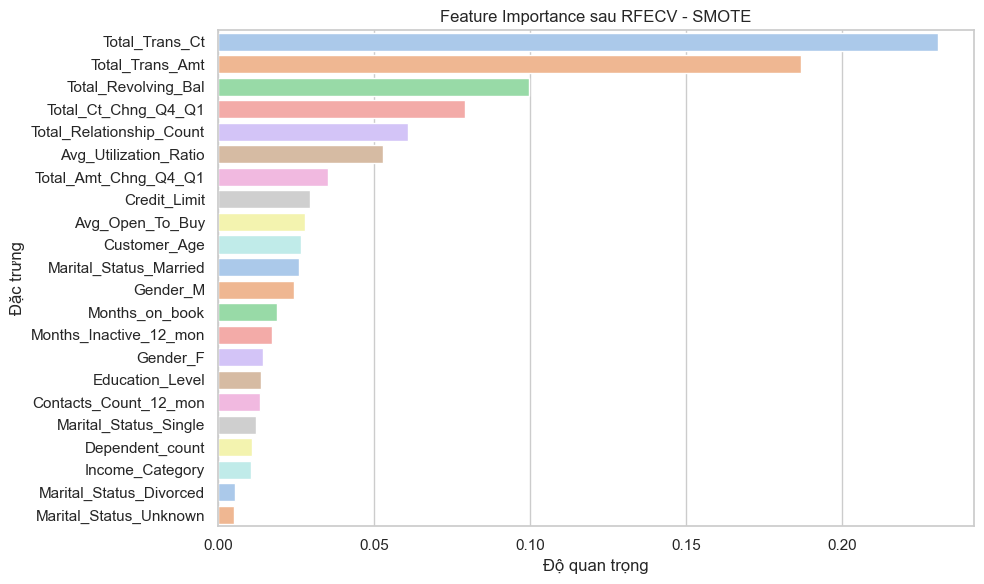

C:\Users\dieut\AppData\Local\Temp\ipykernel_21832\2066436992.py:27: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




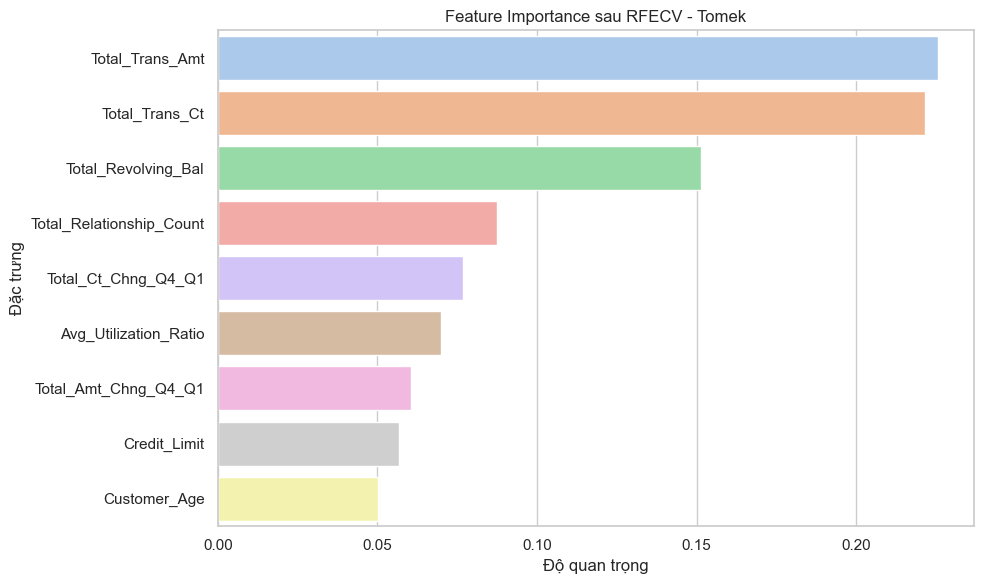

In [44]:
# --- SMOTE ---
importances_smote = rfecv_smote.estimator_.feature_importances_
features_smote = selected_features_smote

# Sắp xếp theo độ quan trọng
indices_smote = np.argsort(importances_smote)[::-1]
features_smote_sorted = features_smote[indices_smote]
importances_smote_sorted = importances_smote[indices_smote]

plt.figure(figsize=(10, 6))
sns.barplot(x=importances_smote_sorted, y=features_smote_sorted, palette='pastel')
plt.title("Feature Importance sau RFECV - SMOTE")
plt.xlabel("Độ quan trọng")
plt.ylabel("Đặc trưng")
plt.tight_layout()
plt.show()

# --- TOMEK ---
importances_tomek = rfecv_tomek.estimator_.feature_importances_
features_tomek = selected_features_tomek

indices_tomek = np.argsort(importances_tomek)[::-1]
features_tomek_sorted = features_tomek[indices_tomek]
importances_tomek_sorted = importances_tomek[indices_tomek]

plt.figure(figsize=(10, 6))
sns.barplot(x=importances_tomek_sorted, y=features_tomek_sorted, palette='pastel')
plt.title("Feature Importance sau RFECV - Tomek")
plt.xlabel("Độ quan trọng")
plt.ylabel("Đặc trưng")
plt.tight_layout()
plt.show()


+ Đánh giá độ chính xác là một bước quan trọng trong việc hiểu và so sánh hiệu quả của các mô hình đã được huấn luyện. Đặc biệt, khi sử dụng các kỹ thuật xử lý dữ liệu như SMOTE hoặc Tomek Links, việc đánh giá độ chính xác cho phép bạn kiểm tra xem những chiến lược xử lý dữ liệu này có cải thiện hiệu suất của mô hình hay không.
+ Sử dụng RFE để chọn 10 đặc trưng tốt nhất, tập huấn luyện có 11675 mẫu và tập kiểm tra có 2919 mẫu.

## **5. Huấn luyện mô hình & Đánh giá mô hình (MODEL TRAINING & EVALUATE)**

In [45]:
classifiers = {
    "Logistic Regression": LogisticRegression(
        random_state=42, max_iter=1500, n_jobs=-1, C=0.1, class_weight='balanced'
    ),
    
    "Random Forest": RandomForestClassifier(
        random_state=42, n_jobs=-1, max_depth=7, min_samples_split=10,
        min_samples_leaf=4, max_features="sqrt", class_weight='balanced'
    ),
    
    "K-Nearest Neighbors": KNeighborsClassifier(
        n_jobs=-1, n_neighbors=5, weights="distance"
    ),
    
    "XGBoost": XGBClassifier(
        random_state=42, use_label_encoder=False, eval_metric="logloss", n_jobs=-1,
        subsample=0.8, min_child_weight=5, max_depth=3, reg_lambda=1 , reg_alpha=0.1,
        learning_rate=0.05, colsample_bytree=0.7,
        scale_pos_weight=1.5 
    )
}

+ reg_lambda (L2 regularization) điều chỉnh mức độ phạt cho các tham số có giá trị lớn trong mô hình.
+ reg_alpha (L1 regularization) điều chỉnh mức độ phạt cho các tham số có giá trị nhỏ hoặc bằng 0 trong mô hình.

#### **5.1. Đánh giá K-fold Cross-Validation và Lựa chọn Đặc trưng (Feature Selection)**

- Sử dụng Recursive Feature Elimination (RFE) để chọn các đặc trưng và sau đó đánh giá các mô hình phân loại khác nhau bằng cách sử dụng cross-validation
> Áp dụng Cross-Validation thông qua pipelines giúp kiểm tra mô hình một cách toàn diện. Phương pháp này đánh giá hiệu suất của mô hình trên nhiều tập dữ liệu khác nhau, tránh overfitting

In [46]:
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import (
    accuracy_score, classification_report, confusion_matrix, roc_auc_score
)
from tabulate import tabulate

# Vẽ ma trận nhầm lẫn trung bình
def plot_confusion_matrix(cm, model_name, method_name):
    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["Negative", "Positive"], yticklabels=["Negative", "Positive"])
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.title(f"Confusion Matrix - {model_name} ({method_name})")
    plt.show()

# Đánh giá mô hình với dữ liệu ĐÃ TIỀN XỬ LÍ
def evaluate_models(X, y, method_name, classifiers):
    print(f"\n========== Evaluating {method_name} with K-Fold (k=10) ==========\n")

    all_results = {}
    kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

    for model_name, model in classifiers.items():
        print(f"\n🔍 Training {model_name} with K-Fold...")

        acc_scores, f1_scores, precision_scores, recall_scores, roc_auc_scores = [], [], [], [], []
        all_cm = np.zeros((2, 2))   # Ma trận nhầm lẫn tổng
        all_reports = []             # Danh sách classification reports

        for train_idx, test_idx in kfold.split(X, y):
            X_train, X_test = X[train_idx], X[test_idx]
            y_train, y_test = y[train_idx], y[test_idx]

            # Không áp dụng SMOTE nữa vì dữ liệu đã xử lý
            model.fit(X_train, y_train)
            y_pred = model.predict(X_test)

            # Đánh giá
            acc_scores.append(accuracy_score(y_test, y_pred))
            report = classification_report(y_test, y_pred, output_dict=True)
            all_reports.append(report)

            f1_scores.append(report["macro avg"]["f1-score"])
            precision_scores.append(report["macro avg"]["precision"])
            recall_scores.append(report["macro avg"]["recall"])

            # ROC AUC nếu có xác suất dự đoán
            if hasattr(model, "predict_proba"):
                try:
                    roc_auc_scores.append(roc_auc_score(y_test, model.predict_proba(X_test)[:, 1]))
                except:
                    roc_auc_scores.append(None)

            cm = confusion_matrix(y_test, y_pred)
            all_cm += cm

        # Trung bình ma trận nhầm lẫn
        avg_cm = np.round(all_cm / kfold.get_n_splits()).astype(int)
        plot_confusion_matrix(avg_cm, model_name=model_name, method_name=method_name)

        # Tổng hợp kết quả
        all_results[model_name] = {
            "Accuracy": np.mean(acc_scores),
            "F1 Score": np.mean(f1_scores),
            "Precision": np.mean(precision_scores),
            "Recall": np.mean(recall_scores),
            "ROC AUC": np.mean([x for x in roc_auc_scores if x is not None]) if any(roc_auc_scores) else None,
            "Classification Report": all_reports  # Lưu trữ danh sách reports
        }

        # In kết quả
        print(f"\n📊 {model_name} - Accuracy: {all_results[model_name]['Accuracy']:.4f}")
        if all_results[model_name]["ROC AUC"] is not None:
            print(f"🎯 ROC AUC: {all_results[model_name]['ROC AUC']:.4f}")
        else:
            print("⚠️ ROC AUC: Not available")
        print("-" * 50)

        # In classification report trung bình
        print(f"\n📜 Average Classification Report for {model_name} ({method_name}):")
        avg_report = {
            "precision": np.mean([report["macro avg"]["precision"] for report in all_reports]),
            "recall": np.mean([report["macro avg"]["recall"] for report in all_reports]),
            "f1-score": np.mean([report["macro avg"]["f1-score"] for report in all_reports]),
            "support": np.mean([report["macro avg"]["support"] for report in all_reports]),
            "0": {
                "precision": np.mean([report["0"]["precision"] for report in all_reports]),
                "recall": np.mean([report["0"]["recall"] for report in all_reports]),
                "f1-score": np.mean([report["0"]["f1-score"] for report in all_reports]),
                "support": np.mean([report["0"]["support"] for report in all_reports]),
            },
            "1": {
                "precision": np.mean([report["1"]["precision"] for report in all_reports]),
                "recall": np.mean([report["1"]["recall"] for report in all_reports]),
                "f1-score": np.mean([report["1"]["f1-score"] for report in all_reports]),
                "support": np.mean([report["1"]["support"] for report in all_reports]),
            },
        }
        headers = ["precision", "recall", "f1-score", "support"]
        rows = []

        # Class 0
        rows.append([
            "Attrited",  # Class 0
            f"{avg_report['0']['precision']:.4f}",
            f"{avg_report['0']['recall']:.4f}",
            f"{avg_report['0']['f1-score']:.4f}",
            f"{avg_report['0']['support']:.1f}"
        ])

        # Class 1
        rows.append([
            "Existing",  # Class 1
            f"{avg_report['1']['precision']:.4f}",
            f"{avg_report['1']['recall']:.4f}",
            f"{avg_report['1']['f1-score']:.4f}",
            f"{avg_report['1']['support']:.1f}"
        ])

        # Macro avg
        rows.append([
            "macro avg",
            f"{avg_report['precision']:.4f}",
            f"{avg_report['recall']:.4f}",
            f"{avg_report['f1-score']:.4f}",
            f"{avg_report['support']:.1f}"
        ])

        # In theo định dạng giống classification_report
        print(f"\nClassification Report - {model_name} ({method_name}):\n")
        print(tabulate(rows, headers=[""] + headers, tablefmt="plain"))

    return all_results


========== Evaluating RFE + SMOTE with K-Fold (k=10) ==========


🔍 Training Logistic Regression with K-Fold...


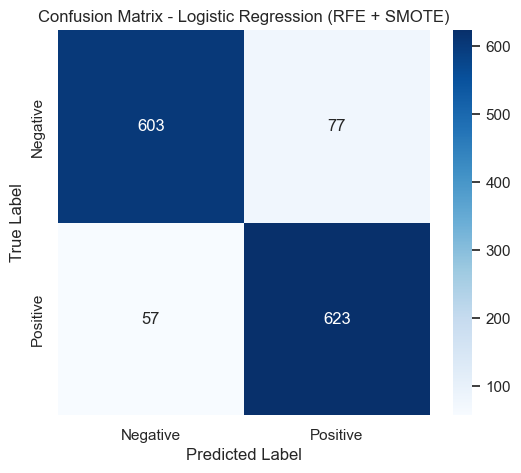


📊 Logistic Regression - Accuracy: 0.9015
🎯 ROC AUC: 0.9685
--------------------------------------------------

📜 Average Classification Report for Logistic Regression (RFE + SMOTE):

Classification Report - Logistic Regression (RFE + SMOTE):

             precision    recall    f1-score    support
Attrited        0.914     0.8865      0.9         679.9
Existing        0.8898    0.9165      0.9029      679.9
macro avg       0.9019    0.9015      0.9014     1359.8

🔍 Training Random Forest with K-Fold...


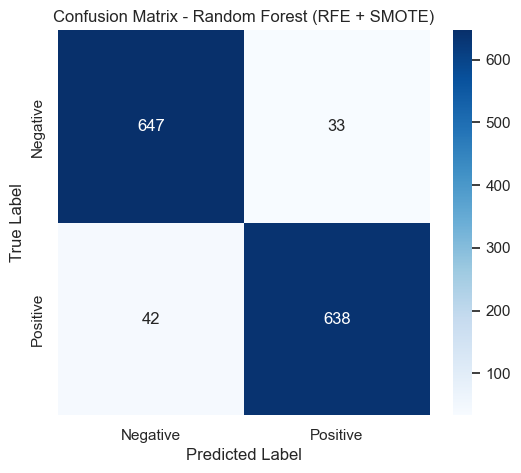


📊 Random Forest - Accuracy: 0.9450
🎯 ROC AUC: 0.9872
--------------------------------------------------

📜 Average Classification Report for Random Forest (RFE + SMOTE):

Classification Report - Random Forest (RFE + SMOTE):

             precision    recall    f1-score    support
Attrited        0.9396    0.9512      0.9453      679.9
Existing        0.9506    0.9388      0.9446      679.9
macro avg       0.9451    0.945       0.945      1359.8

🔍 Training K-Nearest Neighbors with K-Fold...


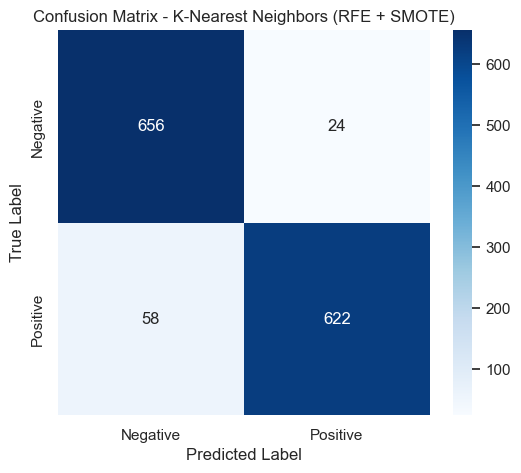


📊 K-Nearest Neighbors - Accuracy: 0.9391
🎯 ROC AUC: 0.9814
--------------------------------------------------

📜 Average Classification Report for K-Nearest Neighbors (RFE + SMOTE):

Classification Report - K-Nearest Neighbors (RFE + SMOTE):

             precision    recall    f1-score    support
Attrited        0.9183    0.9641      0.9406      679.9
Existing        0.9623    0.9141      0.9375      679.9
macro avg       0.9403    0.9391      0.9391     1359.8

🔍 Training XGBoost with K-Fold...


c:\Users\dieut\AppData\Local\Programs\Python\Python312\Lib\site-packages\xgboost\core.py:158: UserWarning:

[11:41:09] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0c55ff5f71b100e98-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.


c:\Users\dieut\AppData\Local\Programs\Python\Python312\Lib\site-packages\xgboost\core.py:158: UserWarning:

[11:41:09] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0c55ff5f71b100e98-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.


c:\Users\dieut\AppData\Local\Programs\Python\Python312\Lib\site-packages\xgboost\core.py:158: UserWarning:

[11:41:09] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0c55ff5f71b100e98-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.


c:\Users\dieut\AppData\Local\Programs\Python\Python3

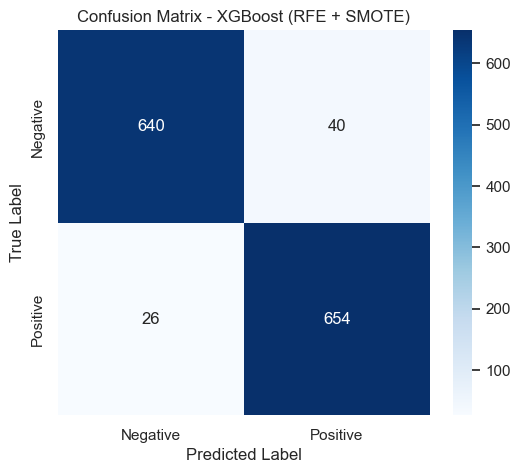


📊 XGBoost - Accuracy: 0.9518
🎯 ROC AUC: 0.9911
--------------------------------------------------

📜 Average Classification Report for XGBoost (RFE + SMOTE):

Classification Report - XGBoost (RFE + SMOTE):

             precision    recall    f1-score    support
Attrited        0.961     0.9419      0.9513      679.9
Existing        0.9431    0.9616      0.9522      679.9
macro avg       0.952     0.9518      0.9517     1359.8

========== Evaluating RFE + Tomek with K-Fold (k=10) ==========


🔍 Training Logistic Regression with K-Fold...


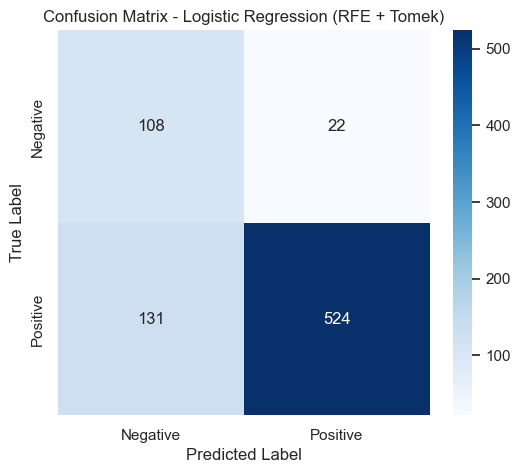


📊 Logistic Regression - Accuracy: 0.8056
🎯 ROC AUC: 0.8945
--------------------------------------------------

📜 Average Classification Report for Logistic Regression (RFE + Tomek):

Classification Report - Logistic Regression (RFE + Tomek):

             precision    recall    f1-score    support
Attrited        0.4535    0.8333      0.5871      130.2
Existing        0.9603    0.8         0.8728      654.6
macro avg       0.7069    0.8167      0.7299      784.8

🔍 Training Random Forest with K-Fold...


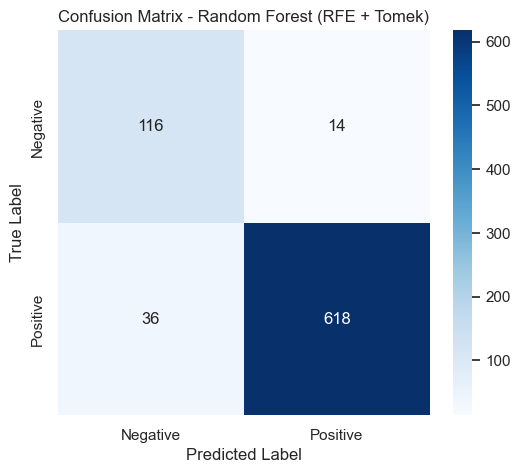


📊 Random Forest - Accuracy: 0.9358
🎯 ROC AUC: 0.9777
--------------------------------------------------

📜 Average Classification Report for Random Forest (RFE + Tomek):

Classification Report - Random Forest (RFE + Tomek):

             precision    recall    f1-score    support
Attrited        0.7627    0.8917      0.8217      130.2
Existing        0.9777    0.9445      0.9608      654.6
macro avg       0.8702    0.9181      0.8913      784.8

🔍 Training K-Nearest Neighbors with K-Fold...


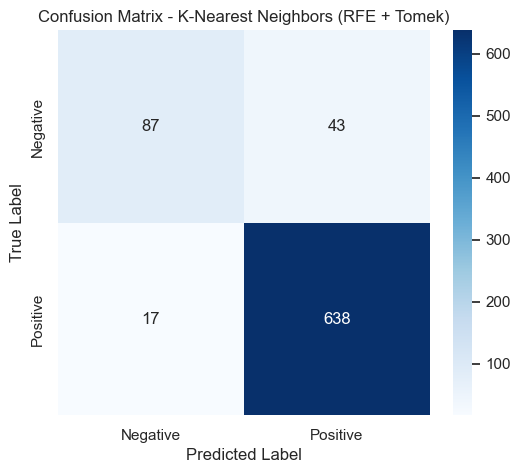


📊 K-Nearest Neighbors - Accuracy: 0.9232
🎯 ROC AUC: 0.9249
--------------------------------------------------

📜 Average Classification Report for K-Nearest Neighbors (RFE + Tomek):

Classification Report - K-Nearest Neighbors (RFE + Tomek):

             precision    recall    f1-score    support
Attrited        0.8359    0.6682      0.7421      130.2
Existing        0.9366    0.9739      0.9549      654.6
macro avg       0.8862    0.821       0.8485      784.8

🔍 Training XGBoost with K-Fold...


c:\Users\dieut\AppData\Local\Programs\Python\Python312\Lib\site-packages\xgboost\core.py:158: UserWarning:

[11:41:17] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0c55ff5f71b100e98-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.


c:\Users\dieut\AppData\Local\Programs\Python\Python312\Lib\site-packages\xgboost\core.py:158: UserWarning:

[11:41:17] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0c55ff5f71b100e98-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.


c:\Users\dieut\AppData\Local\Programs\Python\Python312\Lib\site-packages\xgboost\core.py:158: UserWarning:

[11:41:17] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0c55ff5f71b100e98-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.


c:\Users\dieut\AppData\Local\Programs\Python\Python3

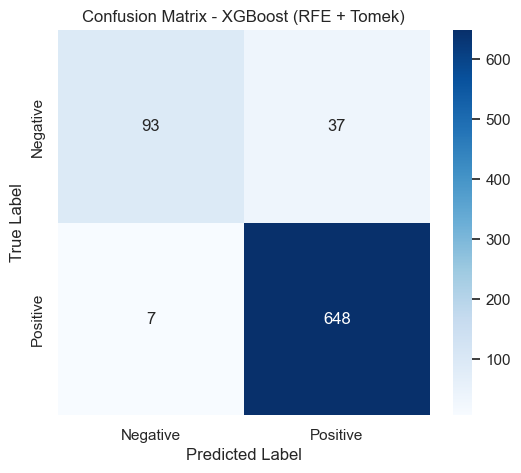


📊 XGBoost - Accuracy: 0.9437
🎯 ROC AUC: 0.9807
--------------------------------------------------

📜 Average Classification Report for XGBoost (RFE + Tomek):

Classification Report - XGBoost (RFE + Tomek):

             precision    recall    f1-score    support
Attrited        0.9302    0.7143      0.8075      130.2
Existing        0.9457    0.9893      0.967       654.6
macro avg       0.938     0.8518      0.8873      784.8


In [47]:
results_rfe_smote = evaluate_models(X_train_smote_rfe, y_train_smote, "RFE + SMOTE", classifiers)
results_rfe_tomek = evaluate_models(X_train_tomek_rfe, y_train_tomek, "RFE + Tomek", classifiers)

In [48]:
def print_result_table(*results_with_labels):
    rows = []

    for label, results in results_with_labels:
        for model_name, metrics in results.items():
            row = {
                "Method": label,
                "Model": model_name,
                "Accuracy": round(metrics["Accuracy"], 4),
                "F1 Score": round(metrics["F1 Score"], 4),
                "Precision": round(metrics["Precision"], 4),
                "Recall": round(metrics["Recall"], 4),
                "ROC AUC": round(metrics["ROC AUC"], 4) if metrics["ROC AUC"] is not None else "N/A"
            }
            rows.append(row)

    df_results = pd.DataFrame(rows)
    print("\n📋 BẢNG TỔNG HỢP KẾT QUẢ MÔ HÌNH:")
    display(df_results.sort_values(by=["Method", "Accuracy"], ascending=[True, False]).reset_index(drop=True))

In [49]:
print_result_table(
    ("RFE + SMOTE", results_rfe_smote),
    ("RFE + Tomek", results_rfe_tomek)
)


📋 BẢNG TỔNG HỢP KẾT QUẢ MÔ HÌNH:


,Method,Model,Accuracy,F1 Score,Precision,Recall,ROC AUC
0,RFE + SMOTE,XGBoost,0.9518,0.9517,0.9520,0.9518,0.9911
1,RFE + SMOTE,Random Forest,0.9450,0.9450,0.9451,0.9450,0.9872
2,RFE + SMOTE,K-Nearest Neighbors,0.9391,0.9391,0.9403,0.9391,0.9814
3,RFE + SMOTE,Logistic Regression,0.9015,0.9014,0.9019,0.9015,0.9685
4,RFE + Tomek,XGBoost,0.9437,0.8873,0.9380,0.8518,0.9807
5,RFE + Tomek,Random Forest,0.9358,0.8913,0.8702,0.9181,0.9777
6,RFE + Tomek,K-Nearest Neighbors,0.9232,0.8485,0.8862,0.8210,0.9249
7,RFE + Tomek,Logistic Regression,0.8056,0.7299,0.7069,0.8167,0.8945


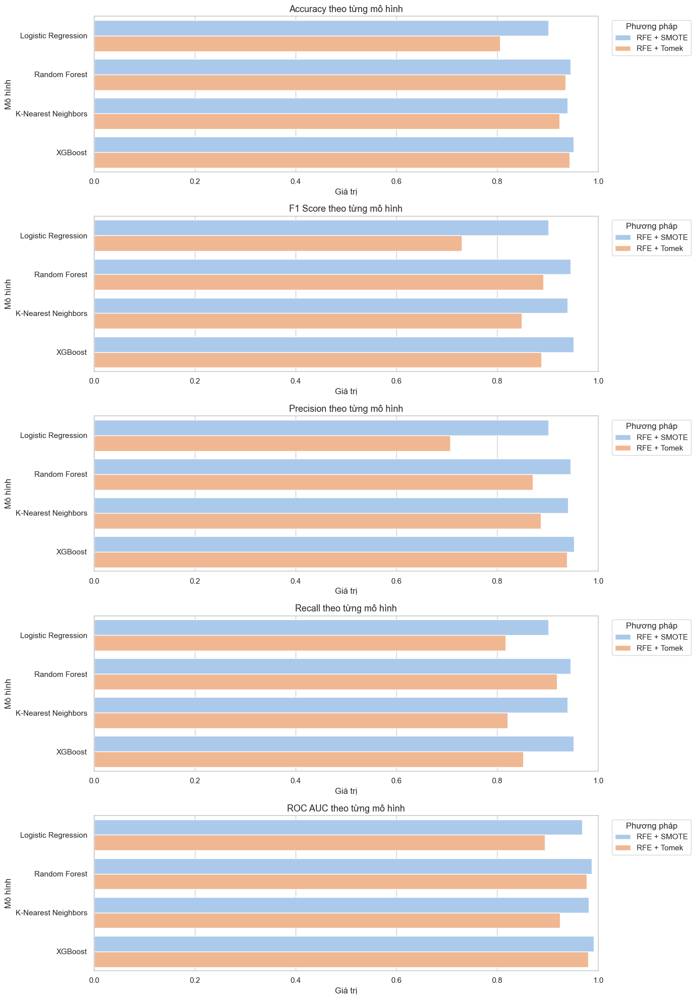

In [50]:
# Biểu đồ so sánh các chỉ số

def plot_metrics_by_model(results_dict_list):
    import pandas as pd
    import seaborn as sns
    import matplotlib.pyplot as plt

    sns.set(style="whitegrid", palette="pastel")

    # Tổng hợp dữ liệu thành DataFrame
    data = []
    for method_name, results_dict in results_dict_list:
        for model_name, metrics in results_dict.items():
            for metric_name, value in metrics.items():
                if metric_name in ["Accuracy", "Precision", "Recall", "F1 Score", "ROC AUC"]:
                    data.append({
                        "Method": method_name,
                        "Model": model_name,
                        "Metric": metric_name,
                        "Value": value if value is not None else 0
                    })

    df = pd.DataFrame(data)

    # Vẽ biểu đồ cho từng chỉ số, chia theo model
    metrics = df["Metric"].unique()
    n_metrics = len(metrics)
    plt.figure(figsize=(14, n_metrics * 4))

    for i, metric in enumerate(metrics, 1):
        plt.subplot(n_metrics, 1, i)
        sns.barplot(
            data=df[df["Metric"] == metric],
            x="Value", y="Model", hue="Method",
            orient="h"
        )
        plt.title(f"{metric} theo từng mô hình", fontsize=13)
        plt.xlim(0, 1)
        plt.xlabel("Giá trị")
        plt.ylabel("Mô hình")
        plt.legend(title="Phương pháp", bbox_to_anchor=(1.02, 1), loc="upper left")

    plt.tight_layout()
    plt.show()

plot_metrics_by_model([
    ("RFE + SMOTE", results_rfe_smote),
    ("RFE + Tomek", results_rfe_tomek),
])


In [ ]:
from sklearn.model_selection import cross_val_score

# Các tập dữ liệu đã xử lý
datasets = {
    "Tomek + RFE": (X_train_tomek_rfe, y_train_tomek),
    "SMOTE + RFE": (X_train_smote_rfe, y_train_smote)
}

all_results = {}  # Lưu kết quả chi tiết từng fold

# Đánh giá mô hình
for method_name, (X_data, y_data) in datasets.items():
    print(f"\n📊 Evaluating {method_name}")
    fold_results = {}
    for name, model in classifiers.items():
        scores = cross_val_score(model, X_data, y_data, cv=10, scoring='recall', n_jobs=-1)
        fold_results[name] = scores
    df_folds = pd.DataFrame(fold_results)
    df_folds.index = [f"Fold {i+1}" for i in range(df_folds.shape[0])]
    summary = df_folds.agg(['mean', 'std', 'var'])
    df_full = pd.concat([df_folds, summary])
    all_results[method_name] = df_full  # Lưu lại
    print(df_full.round(4))

# ✅ Tạo bảng tổng hợp mean, std, var của tất cả mô hình
summary_table = []

for method_name, df in all_results.items():
    summary = df.loc[['mean', 'std', 'var']].T.reset_index()
    summary['Dataset'] = method_name
    summary_table.append(summary)

# Gộp và sắp xếp bảng tổng hợp
final_summary_df = pd.concat(summary_table, ignore_index=True)
final_summary_df = final_summary_df[['Dataset', 'index', 'mean', 'std', 'var']]
final_summary_df.columns = ['Dataset', 'Model', 'Mean Recall', 'Std', 'Variance']

# 🖨️ Hiển thị bảng tổng hợp cuối cùng
print("\n📊 Tổng hợp Recall (Mean, Std, Var) của tất cả mô hình:")
print(final_summary_df.round(4))


📊 Evaluating Tomek + RFE
         Logistic Regression  Random Forest  K-Nearest Neighbors  XGBoost
Fold 1                0.7798         0.9358               0.9648   0.9924
Fold 2                0.8180         0.9480               0.9817   0.9969
Fold 3                0.7878         0.9481               0.9695   0.9893
Fold 4                0.7771         0.9313               0.9588   0.9893
Fold 5                0.8076         0.9573               0.9771   0.9954
Fold 6                0.7954         0.9435               0.9664   0.9893
Fold 7                0.8183         0.9557               0.9725   0.9924
Fold 8                0.8137         0.9344               0.9802   0.9893
Fold 9                0.8073         0.9343               0.9817   0.9908
Fold 10               0.7936         0.9495               0.9725   0.9862
mean                  0.7999         0.9438               0.9725   0.9911
std                   0.0153         0.0094               0.0077   0.0032
var         

In [52]:
print(type(all_results))  # Phải ra <class 'dict'>


<class 'dict'>


In [55]:
# ✅ Tổng hợp mean, std, var cho tất cả mô hình
summary_table = []

for method_name, df in all_results.items():
    summary = df.loc[['mean', 'std', 'var']].T.reset_index()
    summary['Dataset'] = method_name
    summary_table.append(summary)

# ✅ Gộp tất cả lại thành một DataFrame
final_summary_df = pd.concat(summary_table, ignore_index=True)

# ✅ Đổi tên và sắp xếp lại cột
final_summary_df = final_summary_df[['Dataset', 'index', 'mean', 'std', 'var']]
final_summary_df.columns = ['Dataset', 'Model', 'Mean Recall', 'Std', 'Variance']

# ✅ Hiển thị bảng tổng hợp
print("\n📊 Tổng hợp Recall (Mean, Std, Var) của tất cả mô hình:")
print(final_summary_df.round(4))



📊 Tổng hợp Recall (Mean, Std, Var) của tất cả mô hình:
       Dataset                Model  Mean Recall     Std  Variance
0  Tomek + RFE  Logistic Regression       0.7999  0.0153    0.0002
1  Tomek + RFE        Random Forest       0.9438  0.0094    0.0001
2  Tomek + RFE  K-Nearest Neighbors       0.9725  0.0077    0.0001
3  Tomek + RFE              XGBoost       0.9911  0.0032    0.0000
4  SMOTE + RFE  Logistic Regression       0.9165  0.0154    0.0002
5  SMOTE + RFE        Random Forest       0.9387  0.0049    0.0000
6  SMOTE + RFE  K-Nearest Neighbors       0.9113  0.0157    0.0002
7  SMOTE + RFE              XGBoost       0.9612  0.0073    0.0001


In [56]:
# Gộp các các kết quả
all_results = []

for method_name, result_dict in {
    "RFE + SMOTE": results_rfe_smote,
    "RFE + Tomek": results_rfe_tomek
}.items():
    for model_name, metrics in result_dict.items():
        all_results.append({
            "Method": method_name,
            "Model": model_name,
            "Accuracy": metrics["Accuracy"],
            "F1 Score": metrics["F1 Score"],
            "Precision": metrics["Precision"],
            "Recall": metrics["Recall"],
            "ROC AUC": metrics["ROC AUC"]
        })

# Chuyển thành DataFrame
results_summary_df = pd.DataFrame(all_results)

In [57]:
# Tìm mô hình có Recall cao nhất
best_by_recall = results_summary_df.loc[results_summary_df['Recall'].idxmax()]

# In kết quả
print("🎯 Mô hình tốt nhất theo Recall:")
print(best_by_recall[['Method', 'Model', 'Recall']])

🎯 Mô hình tốt nhất theo Recall:
Method    RFE + SMOTE
Model         XGBoost
Recall       0.951756
Name: 3, dtype: object


c:\Users\dieut\AppData\Local\Programs\Python\Python312\Lib\site-packages\xgboost\core.py:158: UserWarning:

[11:56:37] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0c55ff5f71b100e98-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.




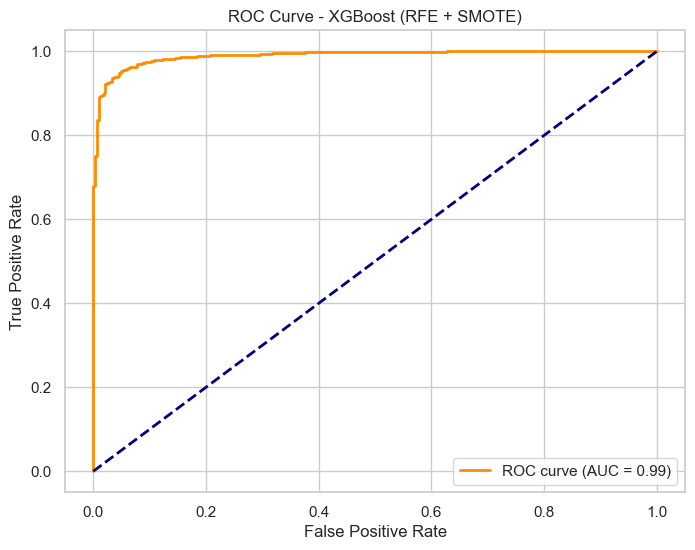

In [58]:
best_method = best_by_recall['Method']
best_model_name = best_by_recall['Model']

# Xác định dữ liệu huấn luyện và kiểm tra tương ứng đã giảm chiều
X_train_best = None
X_test_best = None
y_train_best = None
y_test_best = None

if best_method == "RFE + SMOTE":
    X_train_best = X_train_smote_rfe
    X_test_best = X_test_smote_rfe
    y_train_best = y_train_smote
    y_test_best = y_test
elif best_method == "RFE + Tomek":
    X_train_best = X_train_tomek_rfe
    X_test_best = X_test_tomek_rfe
    y_train_best = y_train_tomek
    y_test_best = y_test

# Khởi tạo và huấn luyện mô hình tốt nhất
if best_model_name == "Logistic Regression":
    model_best = LogisticRegression(random_state=42, solver='liblinear')
elif best_model_name == "KNN":
    model_best = KNeighborsClassifier()
elif best_model_name == "Random Forest":
    model_best = RandomForestClassifier(random_state=42)
elif best_model_name == "XGBoost":
    model_best = XGBClassifier(random_state=42, use_label_encoder=False, eval_metric='logloss')
else:
    model_best = None
    print(f"Không tìm thấy mô hình: {best_model_name}")

if model_best is not None and X_train_best is not None:
    model_best.fit(X_train_best, y_train_best)

    # Dự đoán xác suất trên tập kiểm tra
    if hasattr(model_best, "predict_proba"):
        y_pred_proba = model_best.predict_proba(X_test_best)[:, 1]

        # Tính toán ROC curve
        fpr, tpr, thresholds = roc_curve(y_test_best, y_pred_proba)
        roc_auc = roc_auc_score(y_test_best, y_pred_proba)

        # Vẽ ROC curve
        plt.figure(figsize=(8, 6))
        plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
        plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title(f'ROC Curve - {best_model_name} ({best_method})')
        plt.legend(loc="lower right")
        plt.grid(True)
        plt.show()
    else:
        print(f"Mô hình {best_model_name} không có predict_proba method.")
else:
    print("Không thể xác định dữ liệu hoặc mô hình tốt nhất để vẽ ROC curve.")

<Figure size 600x600 with 0 Axes>

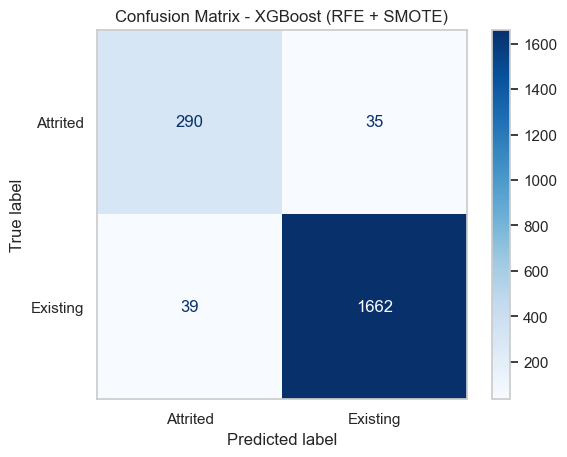

Classification Report - XGBoost (RFE + SMOTE):

              precision    recall  f1-score   support

    Attrited       0.88      0.89      0.89       325
    Existing       0.98      0.98      0.98      1701

    accuracy                           0.96      2026
   macro avg       0.93      0.93      0.93      2026
weighted avg       0.96      0.96      0.96      2026



In [59]:
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay

if model_best is not None and X_test_best is not None:
    # Dự đoán nhãn trên tập kiểm tra
    y_pred = model_best.predict(X_test_best)

    # ==== 1. Confusion Matrix ====
    cm = confusion_matrix(y_test_best, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["Attrited", "Existing"])
    
    plt.figure(figsize=(6, 6))
    disp.plot(cmap=plt.cm.Blues, values_format='d')
    plt.title(f'Confusion Matrix - {best_model_name} ({best_method})')
    plt.grid(False)
    plt.show()

    # ==== 2. Classification Report ====
    report = classification_report(y_test_best, y_pred, target_names=["Attrited", "Existing"])
    print(f"Classification Report - {best_model_name} ({best_method}):\n")
    print(report)
else:
    print("Không thể xác định dữ liệu hoặc mô hình tốt nhất để đánh giá.")

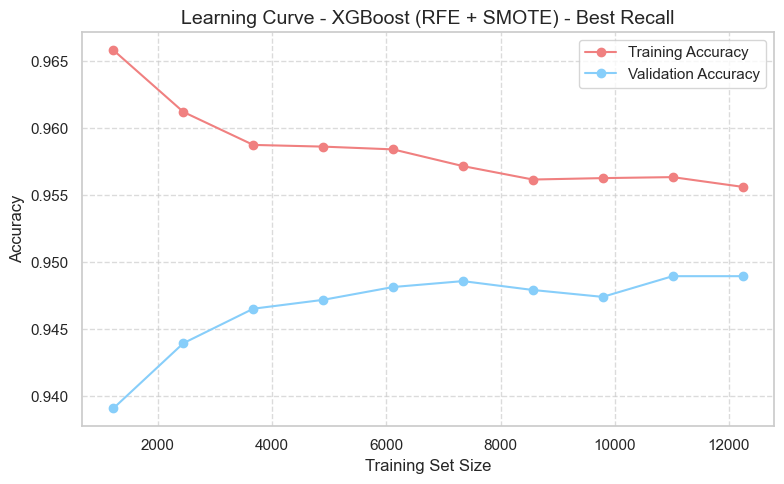

In [60]:
from sklearn.model_selection import learning_curve

def plot_learning_curve(estimator, X, y, title, scoring='accuracy'):
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y,
        cv=10,
        scoring=scoring,
        n_jobs=-1,
        train_sizes=np.linspace(0.1, 1.0, 10),
        shuffle=True,
        random_state=42
    )

    train_mean = np.mean(train_scores, axis=1)
    test_mean = np.mean(test_scores, axis=1)

    plt.figure(figsize=(8, 5))
    plt.plot(train_sizes, train_mean, 'o-', color='lightcoral', label='Training Accuracy')
    plt.plot(train_sizes, test_mean, 'o-', color='lightskyblue', label='Validation Accuracy')
    plt.title(f'Learning Curve - {title}', fontsize=14)
    plt.xlabel('Training Set Size')
    plt.ylabel('Accuracy')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend()
    plt.tight_layout()
    plt.show()

# Ánh xạ lại method → (X, y)
method_data_mapping = {
    "RFE + SMOTE": (X_train_smote_rfe, y_train_smote),
    "RFE + Tomek": (X_train_tomek_rfe, y_train_tomek),
}

# Dữ liệu và mô hình tốt nhất theo Recall
X_recall, y_recall = method_data_mapping[best_by_recall["Method"]]
model_recall = classifiers[best_by_recall["Model"]]

# Vẽ Learning Curve theo Accuracy
plot_learning_curve(model_recall, X_recall, y_recall,
                    f"{best_by_recall['Model']} ({best_by_recall['Method']}) - Best Recall", scoring='accuracy')


- Training accuracy giảm nhẹ khi kích thước dữ liệu tăng (tự nhiên).

- Validation accuracy tăng dần và tiệm cận đường huấn luyện.

> Chứng tỏ mô hình đang học lên ổn định, không quá khớp dữ liệu train -->

- Sự khác biệt giữa hai đường (train vs val) dao động nhẹ (~1–2%).

> Đây là dấu hiệu generalization tốt, mô hình không chỉ học “vẹt” dữ liệu train mà còn dự đoán tốt dữ liệu mới.

+ Trong quy trình machine learning, K-Fold Cross-Validation chỉ dùng để đánh giá hiệu năng mô hình trong giai đoạn huấn luyện, không dùng để dự đoán trên dữ liệu mới
+ Khi dự đoán: Ta cần một mô hình đã được huấn luyện toàn bộ dữ liệu (không chia fold) để có hiệu suất tốt nhất.

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from xgboost import XGBClassifier
from sklearn.feature_selection import RFE
import joblib

# Gán số lượng đặc trưng đã chọn từ bước RFECV trước đó
optimal_n_features_smote_rfe = rfecv_smote.n_features_
print(f"Số lượng đặc trưng tối ưu từ RFECV (SMOTE): {optimal_n_features_smote_rfe}")

# Tạo pipeline đầy đủ
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('rfe', RFE(
        estimator=XGBClassifier(random_state=42, use_label_encoder=False, eval_metric='logloss', scale_pos_weight=1.5),
        n_features_to_select=optimal_n_features_smote_rfe
    )),
    ('classifier', XGBClassifier(random_state=42, use_label_encoder=False, eval_metric='logloss', scale_pos_weight=1.5))
])

# Fit pipeline với toàn bộ X_train_smote (chưa giảm chiều)
pipeline.fit(X_train_smote, y_train_smote)

# Lưu pipeline
joblib.dump(pipeline, 'xgboost_rfe_smote_optimal_pipeline.pkl')

# Load pipeline
pipeline = joblib.load('xgboost_rfe_smote_optimal_pipeline.pkl')

Số lượng đặc trưng tối ưu từ RFECV (SMOTE): 22


c:\Users\dieut\AppData\Local\Programs\Python\Python312\Lib\site-packages\xgboost\core.py:158: UserWarning:

[11:57:15] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0c55ff5f71b100e98-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.


c:\Users\dieut\AppData\Local\Programs\Python\Python312\Lib\site-packages\xgboost\core.py:158: UserWarning:

[11:57:15] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0c55ff5f71b100e98-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.


c:\Users\dieut\AppData\Local\Programs\Python\Python312\Lib\site-packages\xgboost\core.py:158: UserWarning:

[11:57:15] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0c55ff5f71b100e98-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.




In [62]:
new_data_1 = pd.DataFrame([{
    'Customer_Age': 45,
    'Dependent_count': 2,
    'Education_Level': 3,  # College
    'Income_Category': 2,  # $40K - $60K
    'Card_Category': 0,    # Blue
    'Months_on_book': 36,
    'Total_Relationship_Count': 5,
    'Months_Inactive_12_mon': 2,
    'Contacts_Count_12_mon': 3,
    'Credit_Limit': 8000,
    'Total_Revolving_Bal': 1200,
    'Avg_Open_To_Buy': 6800,
    'Total_Trans_Amt': 5100,
    'Total_Trans_Ct': 78,
    'Total_Ct_Chng_Q4_Q1': 0.6,
    'Total_Amt_Chng_Q4_Q1': 0.5,
    'Avg_Utilization_Ratio': 0.15,
    
    # Gender
    'Gender_F': 1,
    'Gender_M': 0,
    
    # Marital_Status
    'Marital_Status_Divorced': 0,
    'Marital_Status_Married': 1,
    'Marital_Status_Single': 0,
    'Marital_Status_Unknown': 0
}])

new_data_1 = new_data_1[X_train.columns]

# Sau đó cho vào pipeline đã lưu
pipeline = joblib.load('xgboost_rfe_smote_optimal_pipeline.pkl')
prediction_1 = pipeline.predict(new_data_1)[0]
proba_1 = pipeline.predict_proba(new_data_1)[0]

print("Dự đoán Attrition_Flag:", prediction_1)
print(f"Xác suất khách hàng ở lại: {proba_1[1]:.4f}")
print(f"Xác suất khách hàng rời đi: {proba_1[0]:.4f}")

Dự đoán Attrition_Flag: 1
Xác suất khách hàng ở lại: 0.9978
Xác suất khách hàng rời đi: 0.0022


In [63]:
new_data_2 = pd.DataFrame([{
    'Customer_Age': 25,
    'Dependent_count': 0,
    'Education_Level': 0,  # Unknown
    'Income_Category': 0,  # Unknown
    'Card_Category': 0,    # Blue
    'Months_on_book': 12,
    'Total_Relationship_Count': 1,
    'Months_Inactive_12_mon': 6,
    'Contacts_Count_12_mon': 0,
    'Credit_Limit': 1000,
    'Total_Revolving_Bal': 1900,
    'Avg_Open_To_Buy': 100,
    'Total_Trans_Amt': 500,
    'Total_Trans_Ct': 10,
    'Total_Ct_Chng_Q4_Q1': 0.1,
    'Total_Amt_Chng_Q4_Q1': 0.5,
    'Avg_Utilization_Ratio': 0.9,

    # Gender
    'Gender_F': 0,
    'Gender_M': 1,

    # Marital_Status
    'Marital_Status_Divorced': 0,
    'Marital_Status_Married': 0,
    'Marital_Status_Single': 1,
    'Marital_Status_Unknown': 0
}])

new_data_2 = new_data_2[X_train.columns]

# Sau đó cho vào pipeline đã lưu
pipeline = joblib.load('xgboost_rfe_smote_optimal_pipeline.pkl')
prediction_2 = pipeline.predict(new_data_2)[0]
proba_2 = pipeline.predict_proba(new_data_2)[0]

print("Dự đoán Attrition_Flag:", prediction_2)
print(f"Xác suất khách hàng ở lại: {proba_2[1]:.4f}")
print(f"Xác suất khách hàng rời đi: {proba_2[0]:.4f}")

Dự đoán Attrition_Flag: 0
Xác suất khách hàng ở lại: 0.0156
Xác suất khách hàng rời đi: 0.9844
